## Analiza Environmental data: Clustering

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import mpl_toolkits.mplot3d
from matplotlib.colors import ListedColormap
import seaborn as sns
import warnings

from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
from sklearn.model_selection import GridSearchCV
from sklearn.linear_model import LassoCV
from sklearn.decomposition import PCA
from sklearn.cluster import AgglomerativeClustering
import scipy.cluster.hierarchy as sch
from scipy.spatial.distance import pdist
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

In [2]:
warnings.filterwarnings('ignore')
sns.set_style('whitegrid')
plt.style.use('seaborn-v0_8-whitegrid')
%matplotlib widget

### Prvi korak - istraživanje podataka

In [3]:
data = pd.read_csv("environment_data.csv")

In [4]:
data.columns

Index(['timestamp', 'sound', 'pressure', 'temp', 'humidity', 'voc', 'pm1.0',
       'pm2.5', 'pm10', 'CO2'],
      dtype='object')

In [5]:
data['timestamp'] = pd.to_datetime(data['timestamp'])
data.set_index('timestamp', inplace=True)

In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 345151 entries, 2022-11-07 00:00:01 to 2022-11-10 23:59:59
Data columns (total 9 columns):
 #   Column    Non-Null Count   Dtype  
---  ------    --------------   -----  
 0   sound     345151 non-null  float64
 1   pressure  345151 non-null  float64
 2   temp      345151 non-null  float64
 3   humidity  345151 non-null  float64
 4   voc       345151 non-null  float64
 5   pm1.0     345151 non-null  float64
 6   pm2.5     345151 non-null  float64
 7   pm10      345151 non-null  float64
 8   CO2       344264 non-null  float64
dtypes: float64(9)
memory usage: 26.3 MB


In [7]:
data.head()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 00:00:01,0.881076,1012.037290,24.777757,35.996349,29466.0,26.0,36.0,45.0,421.0
2022-11-07 00:00:02,0.863325,1012.025698,24.762371,36.002125,29467.0,26.0,36.0,45.0,419.0
2022-11-07 00:00:03,0.908509,1012.083523,24.767500,36.013384,29459.0,26.0,36.0,45.0,418.0
2022-11-07 00:00:04,0.924645,1012.091207,24.767500,36.013384,29454.0,26.0,36.0,44.0,418.0
2022-11-07 00:00:05,0.896406,1012.091207,24.764935,36.013405,29458.5,26.0,36.0,44.0,416.0


In [8]:
data.tail()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-10 23:59:55,1.045672,1023.909475,25.752187,34.016978,29363.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:56,1.042445,1023.909475,25.747058,34.022710,29374.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:57,1.110220,1023.901703,25.736801,34.022842,29379.0,31.0,45.0,56.0,467.0
2022-11-10 23:59:58,1.046479,1023.878387,25.729108,34.054104,29372.5,30.5,44.5,55.5,468.0
2022-11-10 23:59:59,1.131198,1023.905394,25.726544,34.045638,29359.0,30.0,44.0,55.0,470.0


In [9]:
data.describe()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
count,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,345151.000000,344264.000000
mean,1.035109,1014.807431,25.123033,34.636160,30512.354483,49.980410,68.674444,79.883421,442.465660
std,0.493434,2.517912,1.210600,2.652997,1329.625356,27.035828,31.107893,30.668957,28.831611
min,0.000000,1005.339453,20.326285,26.962989,28427.000000,20.000000,30.000000,33.000000,400.000000
25%,0.931100,1013.215952,24.470044,32.984199,29458.000000,33.000000,48.000000,61.000000,418.000000
50%,1.035990,1014.020586,24.972642,34.628268,29964.500000,38.000000,54.000000,68.000000,440.000000
75%,1.229633,1015.415069,25.782958,36.830740,31443.000000,59.000000,85.000000,93.000000,462.000000
max,3.303227,1024.071917,28.293446,41.651724,34535.000000,270.500000,279.500000,428.000000,562.000000


In [10]:
data.var()

sound       2.434773e-01
pressure    6.339881e+00
temp        1.465552e+00
humidity    7.038394e+00
voc         1.767904e+06
pm1.0       7.309360e+02
pm2.5       9.677010e+02
pm10        9.405849e+02
CO2         8.312618e+02
dtype: float64

In [11]:
data.skew()

sound       0.390953
pressure    1.944262
temp        0.120681
humidity   -0.323284
voc         0.762294
pm1.0       1.698947
pm2.5       1.425518
pm10        1.516714
CO2         0.526927
dtype: float64

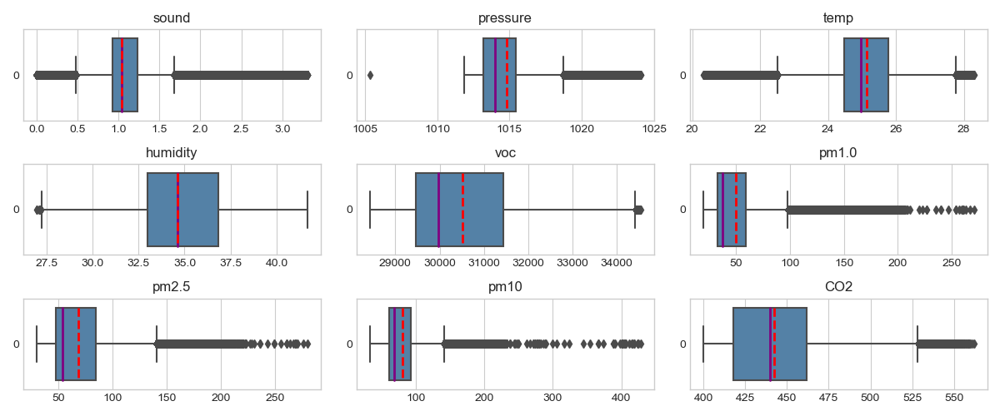

In [12]:
plt.figure(figsize=(12, 5))
for i, feature in enumerate(list(data.columns)):
    plt.subplot(3, 3, i+1)
    plt.title(feature)
    sns.boxplot(data[feature], orient='h', color="steelblue", showmeans=True, meanline=True,
                    medianprops={'linewidth': 2, 'color': 'purple'},
                    meanprops={'linewidth': 2, 'color': 'red'})
plt.tight_layout()

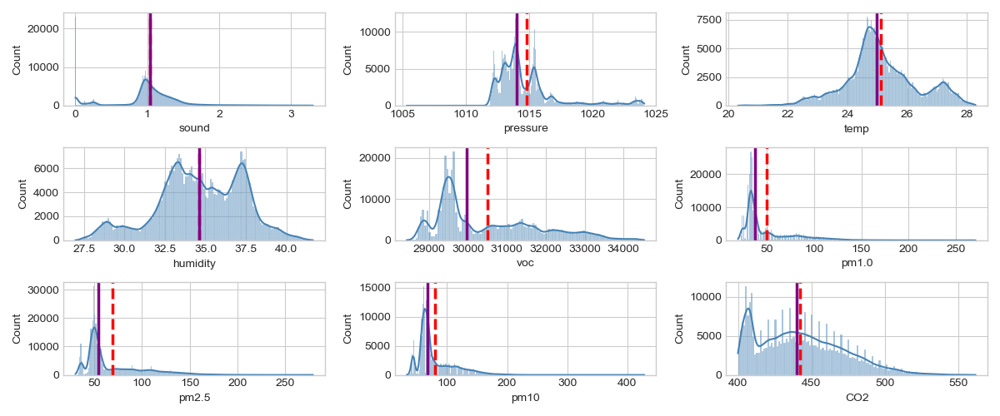

In [13]:
plt.figure(figsize=(12, 5))
for i, feature in enumerate(list(data.columns)):
    plt.subplot(3, 3, i+1)
    sns.histplot(data[feature], kde=True, color="steelblue")
    plt.axvline(x=data[feature].mean(), c='red', ls='--', lw=2.5)
    plt.axvline(x=data[feature].median(), c='purple', ls='-', lw=2.5)
plt.tight_layout()

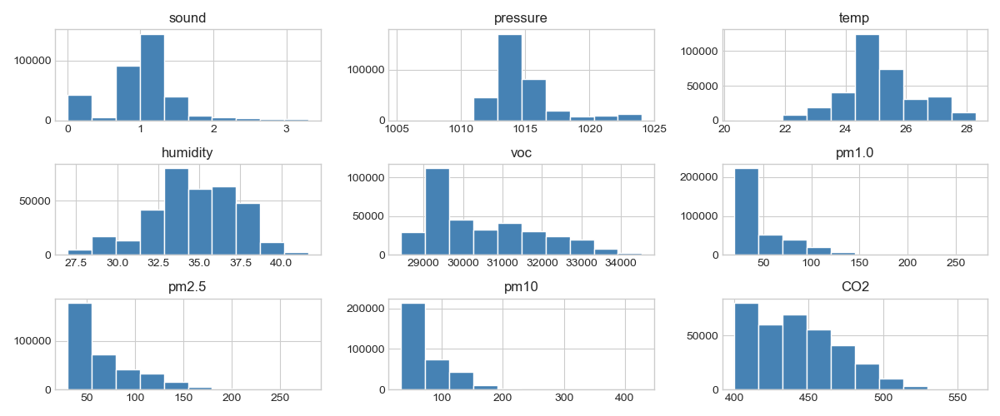

In [14]:
data.hist(figsize=(12, 5), color="steelblue")
plt.tight_layout()

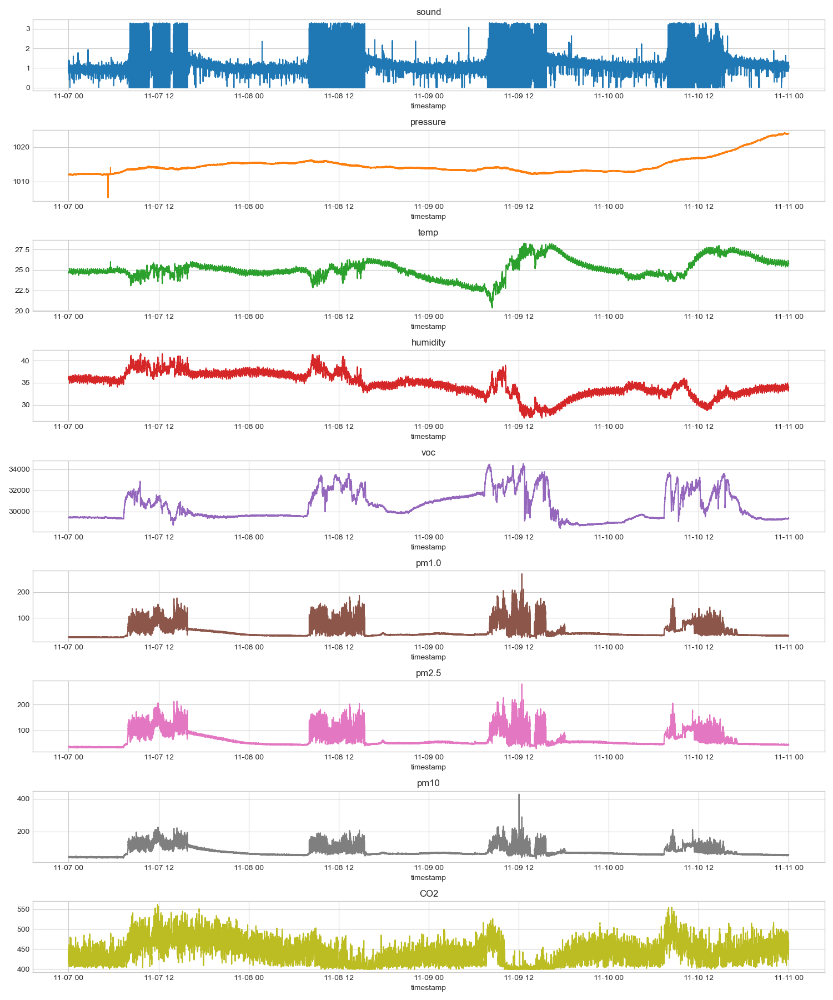

In [15]:
data.plot(figsize=(15, 18), subplots=True, sharex=False, legend=False, title=list(data.columns))
plt.tight_layout()

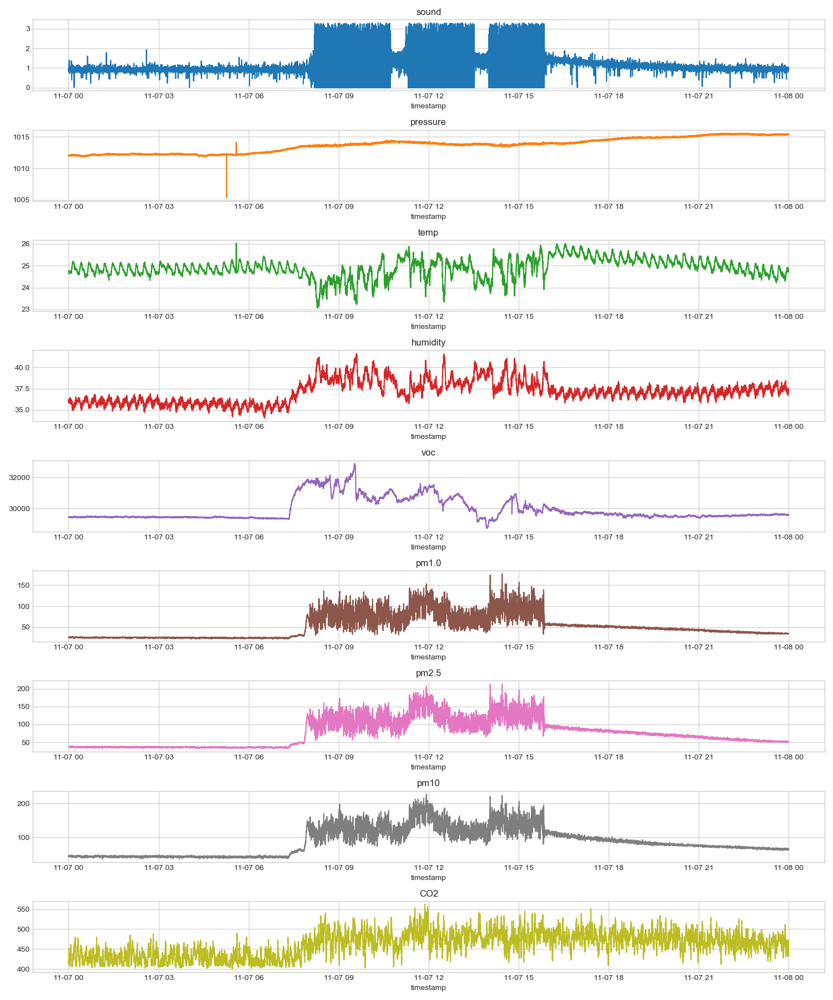

In [16]:
data[:86400].plot(figsize=(15, 18), subplots=True, sharex=False, legend=False, title=list(data.columns))
plt.tight_layout()

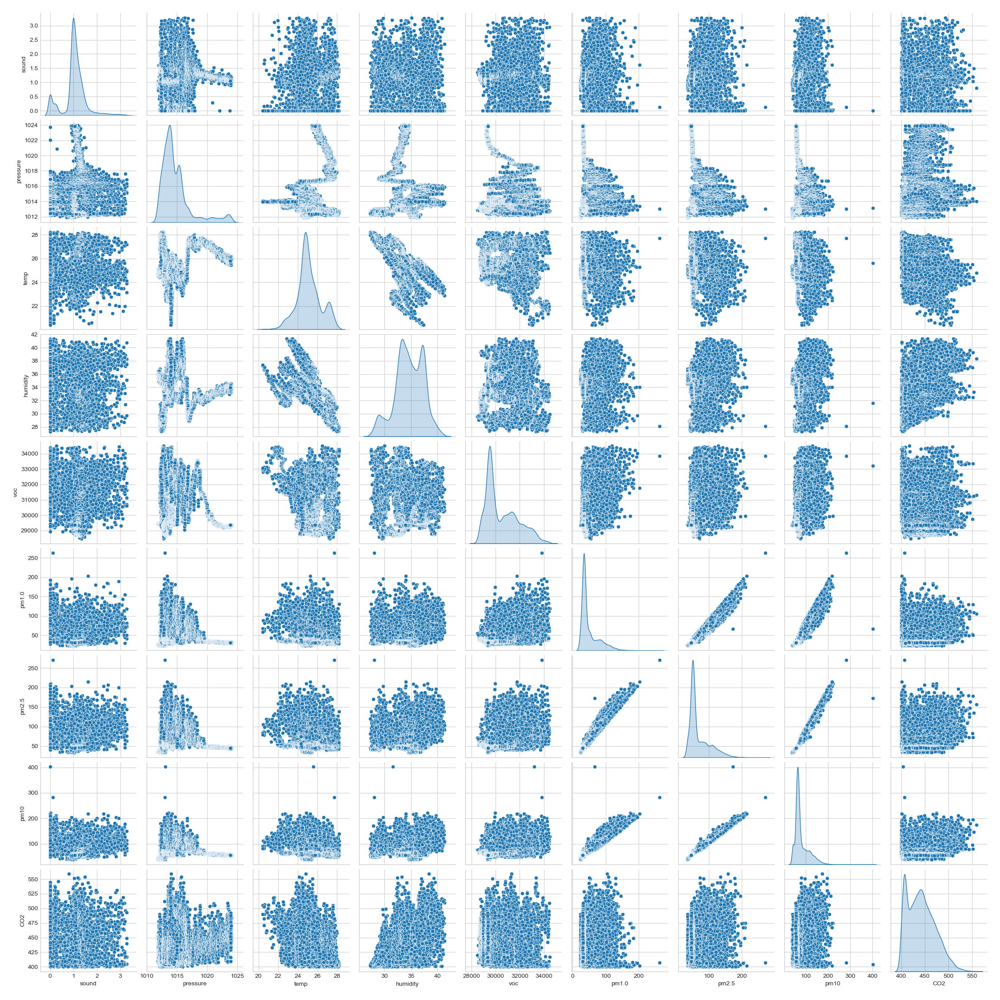

In [60]:
sns.pairplot(data, diag_kind="kde")

[]

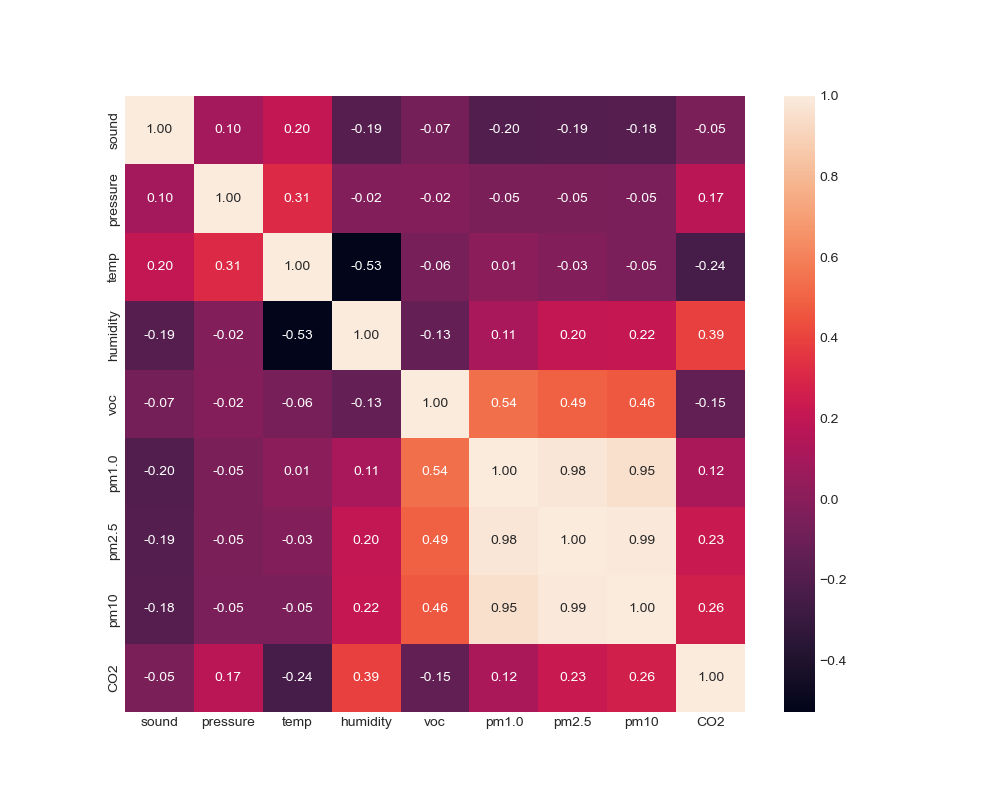

In [17]:
plt.figure(figsize=(10, 8))
sns.heatmap(data.corr(), annot=True, fmt='.2f')
plt.plot()

### Drugi korak - preprocesiranje podataka

In [18]:
print(f"Number of NaN values in dataset:\n{data.isna().sum()}")

Number of NaN values in dataset:
sound         0
pressure      0
temp          0
humidity      0
voc           0
pm1.0         0
pm2.5         0
pm10          0
CO2         887
dtype: int64


In [19]:
imputer = SimpleImputer(strategy="mean")
data[['CO2']] = imputer.fit_transform(data[['CO2']])

In [20]:
print(f"Number of NaN values in dataset:\n{data.isna().sum()}")

Number of NaN values in dataset:
sound       0
pressure    0
temp        0
humidity    0
voc         0
pm1.0       0
pm2.5       0
pm10        0
CO2         0
dtype: int64


In [21]:
print(f"Number of duplicates in dataset: {data.duplicated().sum()}")

Number of duplicates in dataset: 0


In [22]:
print(f"Number of index duplicates in dataset: {data.index.duplicated().sum()}")

Number of index duplicates in dataset: 24


In [23]:
data[data.index.duplicated()]


,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 01:00:00,0.927873,1012.029181,24.885456,35.769386,29454.0,25.0,36.0,44.0,449.0
2022-11-07 05:00:00,0.929487,1012.083651,24.726471,35.821613,29466.0,26.0,37.0,45.0,408.0
2022-11-07 09:00:00,0.731002,1013.577997,24.454659,38.499439,31630.0,69.0,103.0,119.0,487.0
2022-11-07 10:00:00,1.844450,1013.874410,24.449530,38.928240,30666.0,94.0,126.0,139.0,487.0
2022-11-07 11:00:00,1.591100,1014.204036,25.552171,36.589889,30518.0,46.0,78.0,92.0,436.0
2022-11-07 16:00:00,1.391002,1013.957464,25.500885,37.518162,29939.0,57.0,97.0,121.0,496.0
2022-11-08 04:00:00,0.874621,1015.260768,24.695700,37.036374,29647.0,32.0,47.0,59.0,439.0
2022-11-08 05:00:00,1.032763,1015.392091,25.167527,36.219366,29643.0,32.0,46.0,58.0,408.0
2022-11-08 07:00:00,0.916577,1015.672999,24.782885,36.691268,29551.0,31.0,46.0,57.0,425.0


In [24]:
data = data[~data.index.duplicated(keep='first')]

In [25]:
data.resample('30s').interpolate().reset_index()

,timestamp,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
0,2022-11-07 00:00:00,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2022-11-07 00:00:30,0.956112,1012.062426,24.739293,36.041862,29462.5,25.0,36.0,45.0,421.5
2,2022-11-07 00:01:00,0.964988,1011.991563,24.623900,36.195291,29463.0,26.0,38.0,47.0,440.0
3,2022-11-07 00:01:30,0.995648,1012.033767,24.670057,36.177992,29451.0,27.0,38.0,45.0,419.0
4,2022-11-07 00:02:00,0.914963,1012.072187,24.711086,36.149430,29450.0,26.0,37.0,47.0,435.0
...,...,...,...,...,...,...,...,...,...,...
11515,2022-11-10 23:57:30,1.106993,1023.900574,26.003489,33.594159,29354.0,32.0,46.0,56.0,441.0
11516,2022-11-10 23:58:00,1.086015,1023.942064,25.906045,33.742903,29367.0,30.0,44.0,54.0,470.0
11517,2022-11-10 23:58:30,1.086015,1023.956866,25.854759,33.873960,29362.0,32.0,46.0,57.0,451.0
11518,2022-11-10 23:59:00,1.071491,1023.875457,25.808601,33.953912,29359.0,31.0,46.0,57.0,448.0


In [26]:
data = data.resample('30s').interpolate().reset_index().dropna()
data.reset_index(drop=True, inplace=True)
data['timestamp'] = pd.to_datetime(data['timestamp'])
data.set_index('timestamp', inplace=True)

In [27]:
data.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 11519 entries, 2022-11-07 00:00:30 to 2022-11-10 23:59:30
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   sound     11519 non-null  float64
 1   pressure  11519 non-null  float64
 2   temp      11519 non-null  float64
 3   humidity  11519 non-null  float64
 4   voc       11519 non-null  float64
 5   pm1.0     11519 non-null  float64
 6   pm2.5     11519 non-null  float64
 7   pm10      11519 non-null  float64
 8   CO2       11519 non-null  float64
dtypes: float64(9)
memory usage: 899.9 KB


In [28]:
data.head()

,sound,pressure,temp,humidity,voc,pm1.0,pm2.5,pm10,CO2
timestamp,,,,,,,,,
2022-11-07 00:00:30,0.956112,1012.062426,24.739293,36.041862,29462.5,25.0,36.0,45.0,421.5
2022-11-07 00:01:00,0.964988,1011.991563,24.623900,36.195291,29463.0,26.0,38.0,47.0,440.0
2022-11-07 00:01:30,0.995648,1012.033767,24.670057,36.177992,29451.0,27.0,38.0,45.0,419.0
2022-11-07 00:02:00,0.914963,1012.072187,24.711086,36.149430,29450.0,26.0,37.0,47.0,435.0
2022-11-07 00:02:30,0.935941,1012.041327,24.741857,36.115291,29450.0,25.0,37.0,44.0,408.0


In [29]:
scaler = StandardScaler()
scaled_data = scaler.fit_transform(data)
scaled_data_df = pd.DataFrame(scaled_data, columns=data.columns, index=data.index)

### Treći korak - primena hijerarhijskog klasterovanja

In [30]:
def create_dendrogram(linkage, metric, method):
    plt.figure(figsize=(15, 6))
    sch.dendrogram(linkage)
    plt.title(f"Dendrogram - method: {method}, metric: {metric}")
    plt.xlabel('Sample index')
    plt.ylabel('Distance')
    plt.show()

In [31]:
def evaluate_linkage(data, metric, linkage_methods):
    coph_correlations = {}
    best_coph = 0
    res = {}

    for method in linkage_methods:
        z = sch.linkage(data, metric=metric, method=method)
        c, coph_distances = sch.cophenet(z, pdist(data, metric=metric))
        coph_correlations[method] = c

        if c > best_coph:
            best_coph = c
            best_method = method
            best_linkage = z

        create_dendrogram(z, metric, method)

    res["coph_correlations"] = coph_correlations
    res["best_coph"] = best_coph
    res["best_method"] = best_method
    res["best_linkage"] = best_linkage

    return res

In [32]:
linkage_methods = ["single", "complete", "average", "weighted", "centroid", "median", "ward"]

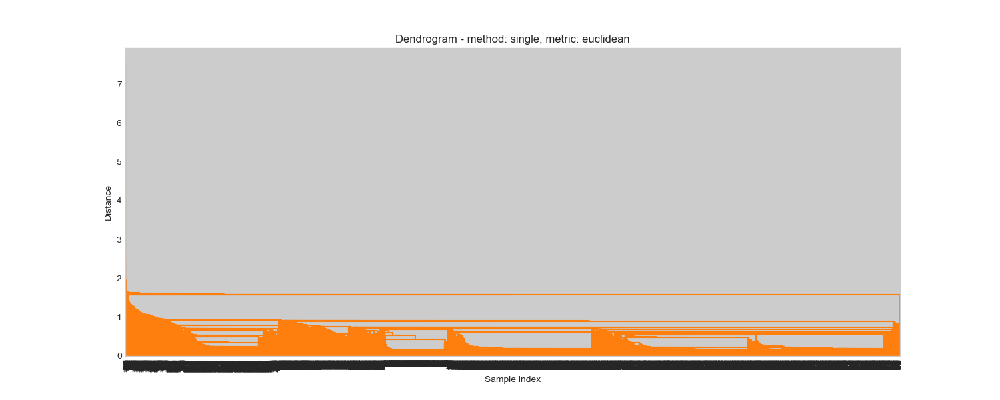

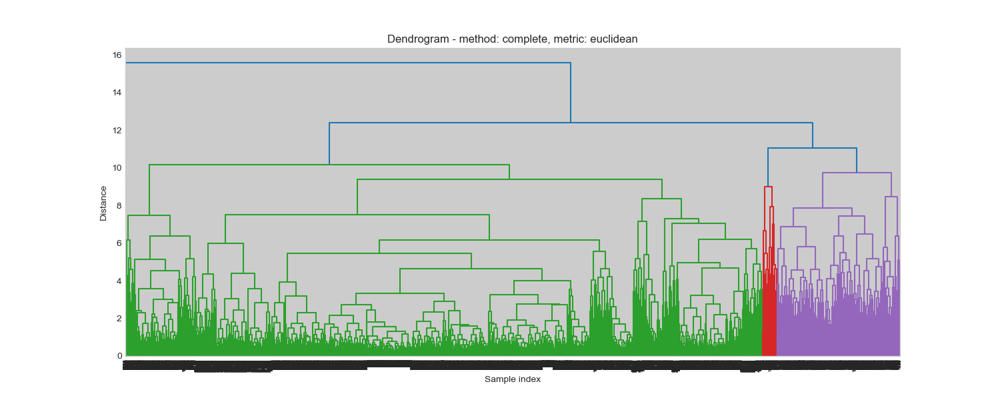

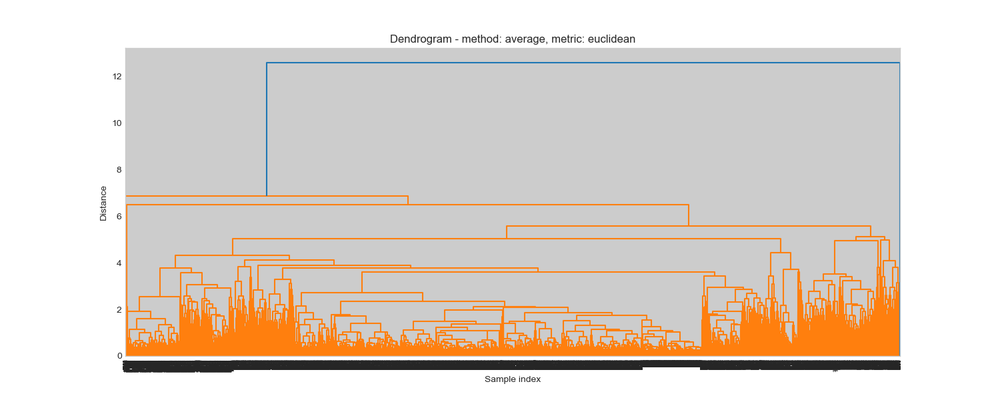

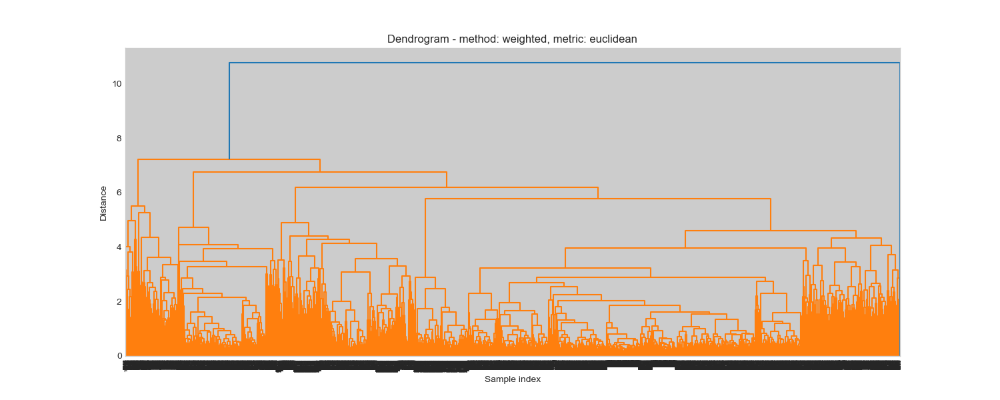

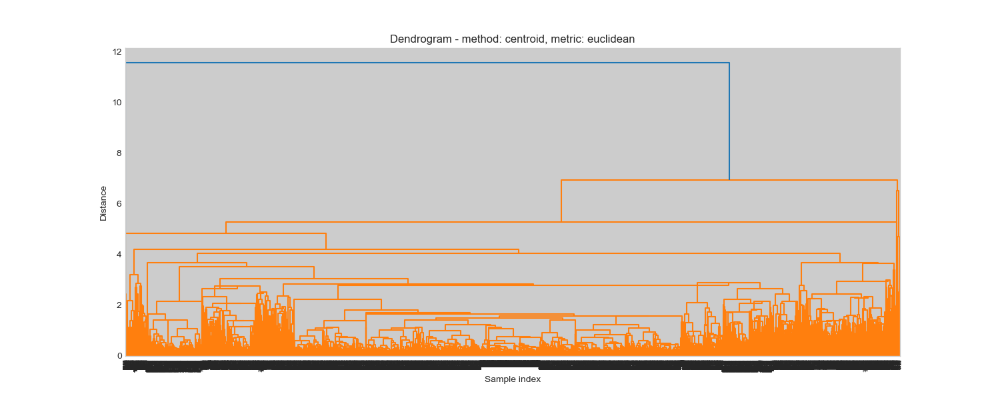

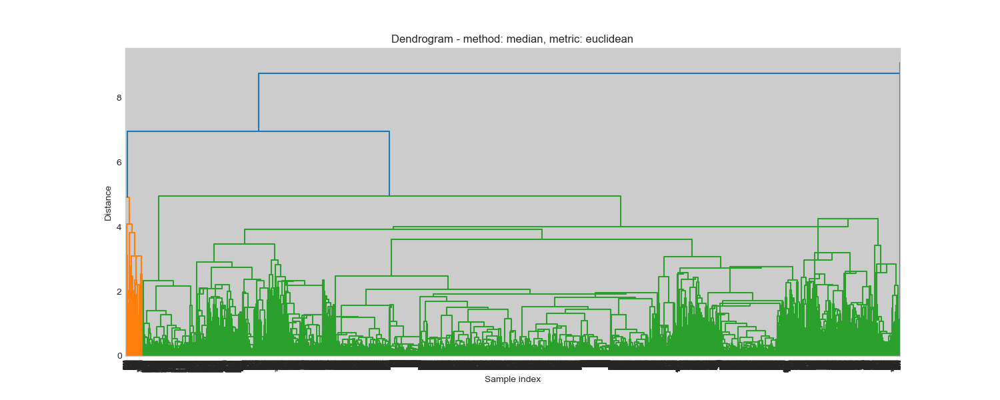

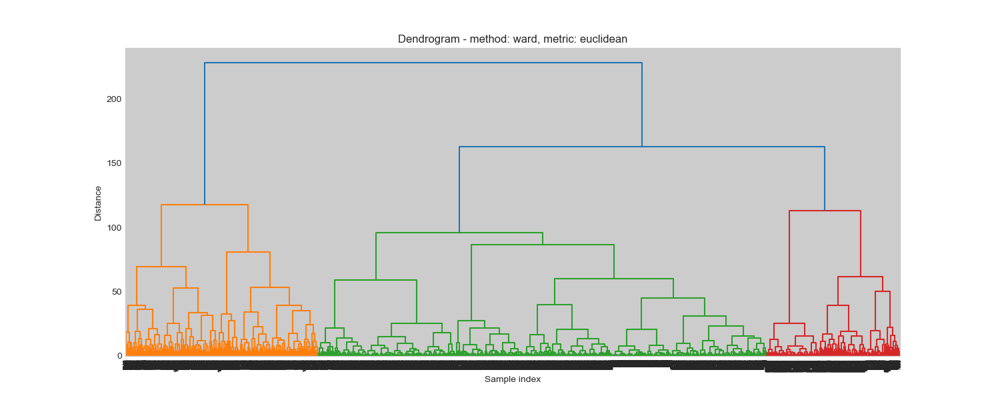

In [33]:
euclidean_res = evaluate_linkage(scaled_data_df, "euclidean", linkage_methods)

In [34]:
linkage_methods.remove("centroid")
linkage_methods.remove("median")
linkage_methods.remove("ward")

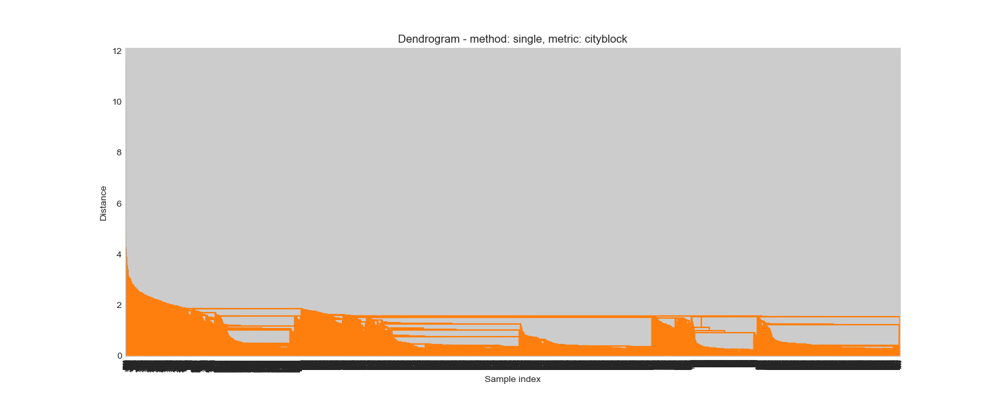

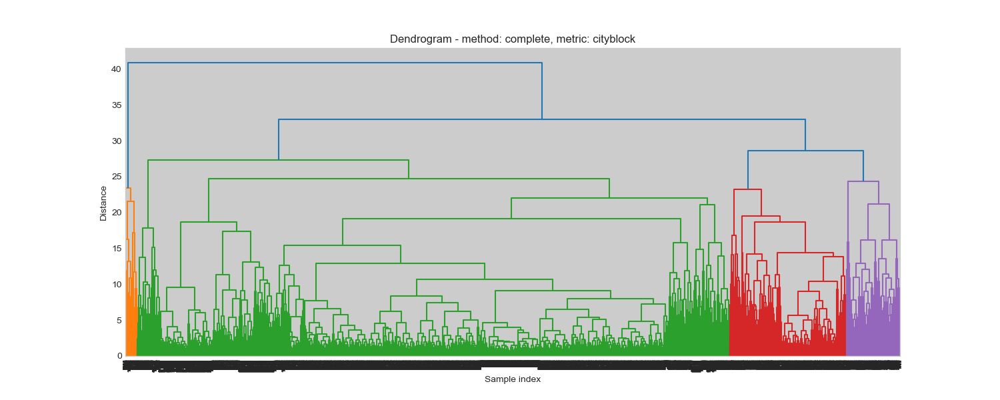

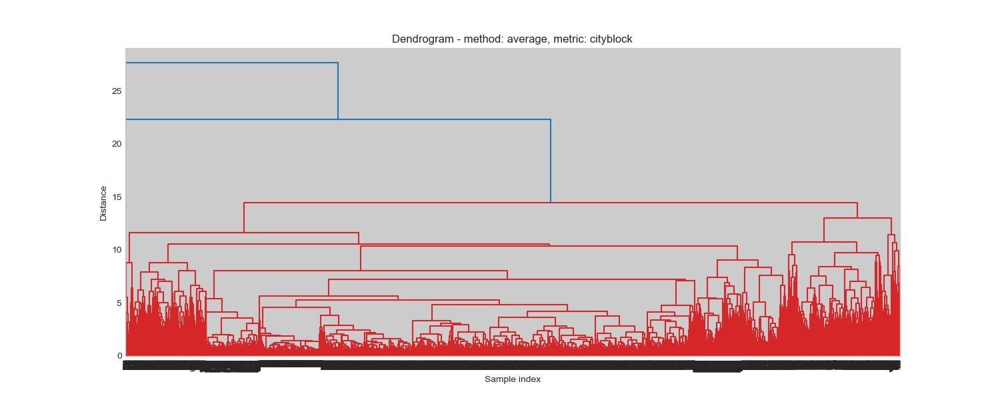

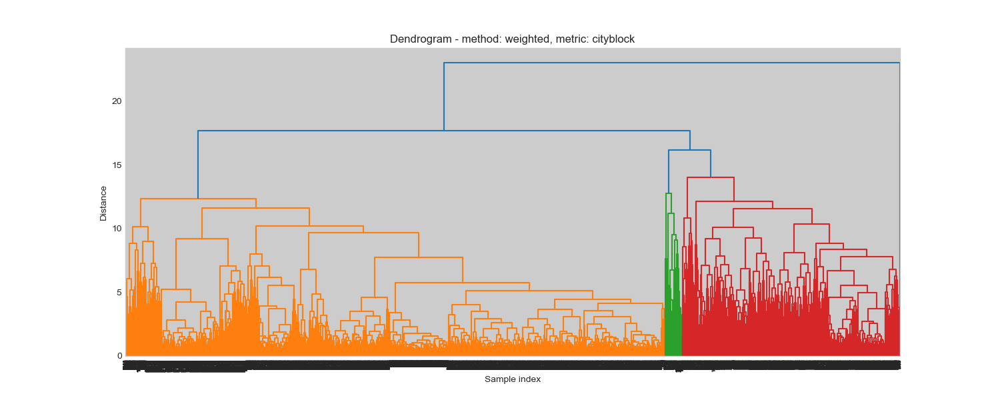

In [35]:
cityblock_res = evaluate_linkage(scaled_data_df, "cityblock", linkage_methods)

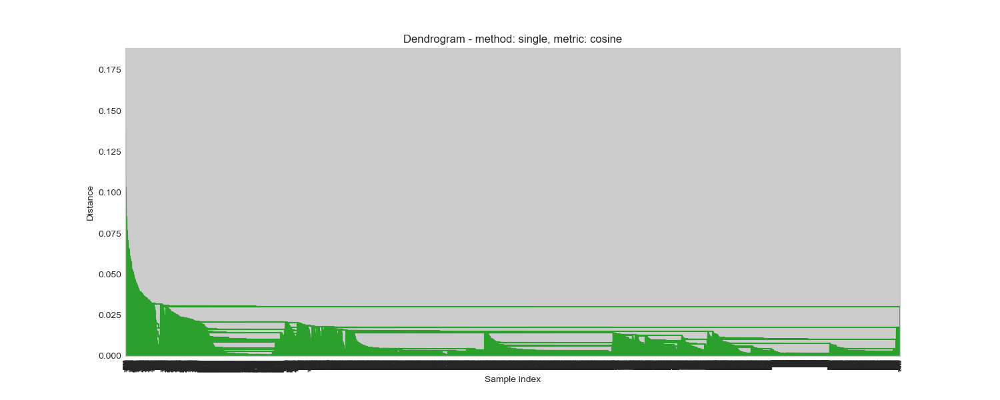

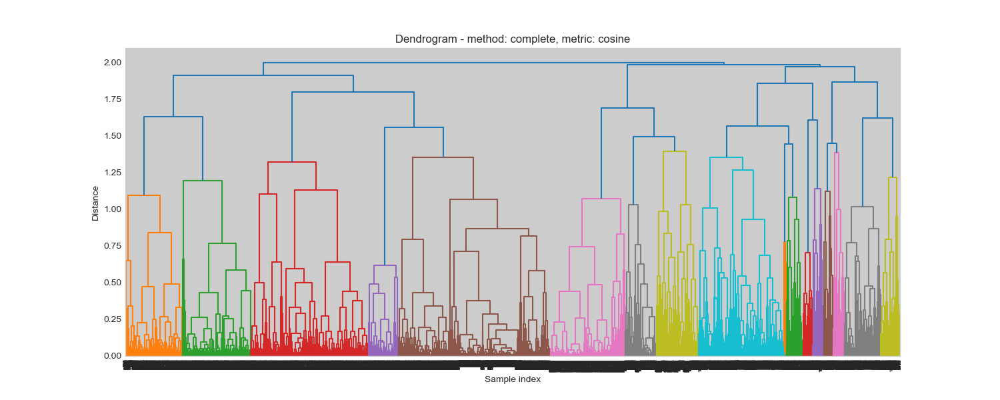

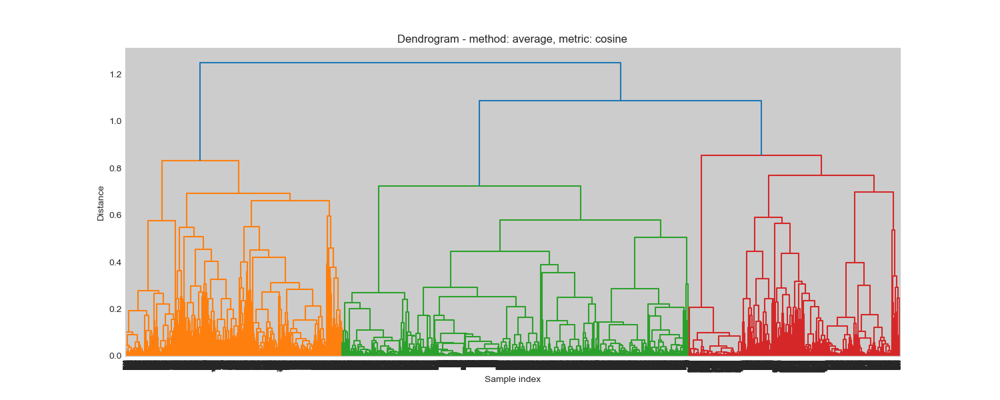

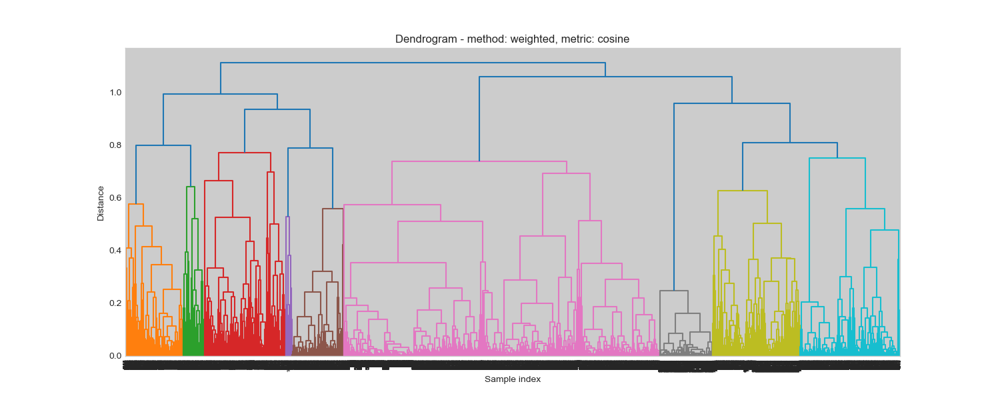

In [36]:
cosine_res = evaluate_linkage(scaled_data_df, "cosine", linkage_methods)

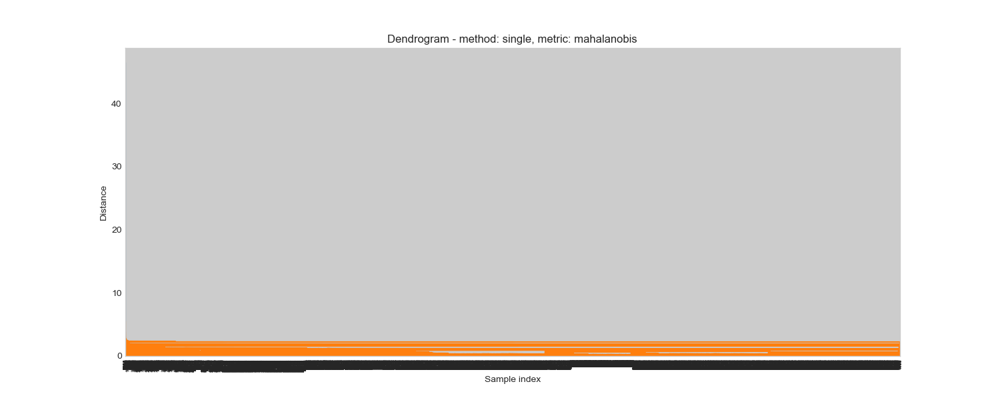

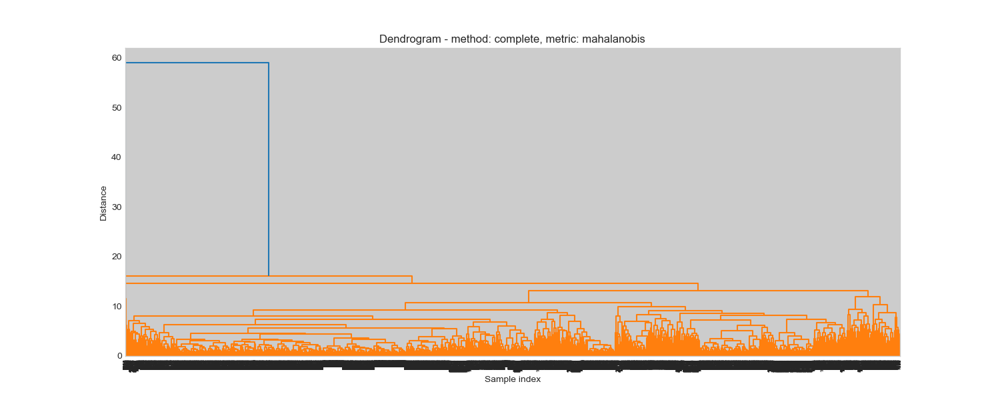

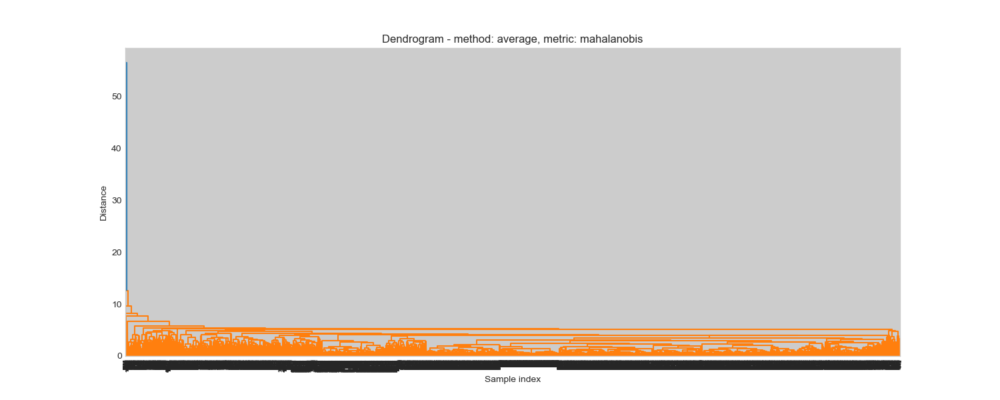

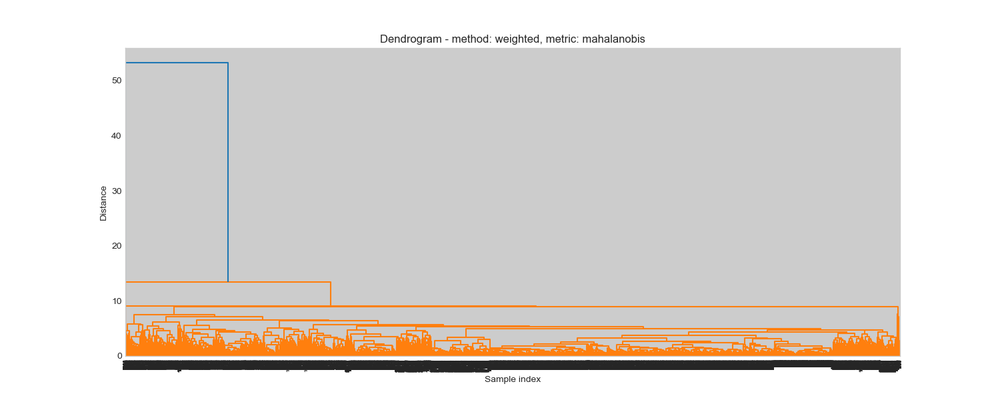

In [37]:
mahalanobis_res = evaluate_linkage(scaled_data_df, "mahalanobis", linkage_methods)

In [38]:
euclidean_res["coph_correlations"]

{'single': 0.6140267019063649,
 'complete': 0.6988740817635607,
 'average': 0.8147850725545775,
 'weighted': 0.5890212242574927,
 'centroid': 0.7956675425111837,
 'median': 0.6523068149573261,
 'ward': 0.7054571153131952}

In [39]:
cityblock_res["coph_correlations"]

{'single': 0.5801034787300716,
 'complete': 0.6714938904589336,
 'average': 0.8192126574061963,
 'weighted': 0.668055288251964}

In [40]:
cosine_res["coph_correlations"]

{'single': 0.2351754945930574,
 'complete': 0.5908876148921887,
 'average': 0.7210526019552347,
 'weighted': 0.6506625103805955}

In [41]:
mahalanobis_res["coph_correlations"]

{'single': 0.6930272990325647,
 'complete': 0.6353459921427725,
 'average': 0.8396967600292128,
 'weighted': 0.7167819810859974}

Najbolji rezultat dobijen je za "mahalanobis" rastojanje, kada se koristi "average" metod.

In [56]:
mahalanobis_res["best_coph"]

0.8396967600292128

In [57]:
mahalanobis_res["best_method"]

'average'

In [58]:
best_linkage = mahalanobis_res["best_linkage"]

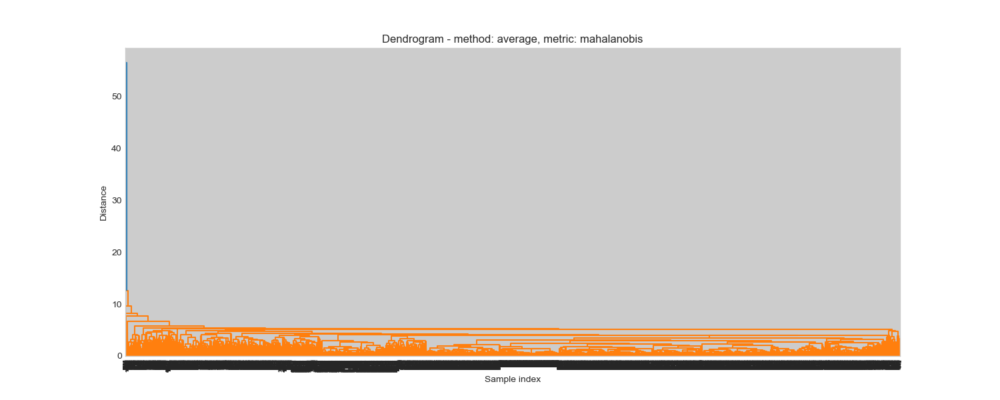

In [59]:
create_dendrogram(best_linkage, "mahalanobis", "average")

### Četvrti korak - određivanje optimalnog broja klastera

Četvrti korak je odrediti optimalan broj klastera. Metode za to nisu striktno određene, tako da 
imate mogućnost eksperimentisanja više različitih načina, kao na primer Silhouette Score, 
Calinski-Harabasz, nešto treće ili eventualno i neka vrsta agregacije.

In [46]:
# def do_agglomerative_grid_search(features):
#     param_grid = {
#         "n_clusters": range(2, 7),
#         "metric": ["euclidean", "manhattan", "cosine", "l1", "l2"],
#         "linkage": ["ward", "complete", "average", "single"]
#     }

#     grid_search = GridSearchCV(
#         AgglomerativeClustering(), param_grid=param_grid, scoring=silhouette_score
#     )

#     grid_search.fit(features)
#     print(grid_search.best_params_)

In [47]:
# do_agglomerative_grid_search(scaled_data_df)

In [48]:
# def doAgglomerative(X, linkage, metric, nclust=2, compute_distances=False):
#     model = AgglomerativeClustering(n_clusters=nclust, linkage=linkage, metric=metric, compute_distances=compute_distances)
#     clusters = model.fit_predict(X)
#     distances = model.distances_
#     print(len(distances))
    
#     return clusters

In [49]:
# clusters = doAgglomerative(scaled_data[:1000], "ward", "euclidean", compute_distances=True)

In [50]:
# def visualize_clusters(features, clusters):
#     fig = plt.figure(figsize=(7, 10))

#     pca_2d = PCA(n_components=2)
#     pcs = pca_2d.fit_transform(features)
#     pc1_values_2d = pcs[:, 0]
#     pc2_values_2d = pcs[:, 1]
   
#     ax1 = fig.add_subplot(2, 1, 1)
#     ax1.set_xlabel("PC1")
#     ax1.set_ylabel("PC2")
#     ax1.set_title("2D visualization")
#     palette = sns.color_palette("bright", n_colors=len(set(clusters)))  
#     sns.scatterplot(x=pc1_values_2d, y=pc2_values_2d, hue=clusters, palette=palette, alpha=0.8, legend='full')

#     pca_3d = PCA(n_components=3)
#     pcs = pca_3d.fit_transform(features)
#     pc1_values_3d = pcs[:, 0]
#     pc2_values_3d = pcs[:, 1]
#     pc3_values_3d = pcs[:, 2]

#     ax2 = fig.add_subplot(2, 1, 2, projection="3d", elev=48, azim=134)
#     ax2.set_xlabel("PC1")
#     ax2.set_ylabel("PC2")
#     ax2.set_zlabel("PC3")
#     ax2.set_title("3D visualization")
#     cmap = ListedColormap(palette)
#     ax2.scatter3D(pc1_values_3d, pc2_values_3d, pc3_values_3d, c=clusters, cmap=cmap)

#     plt.tight_layout()

In [51]:
# visualize_clusters(scaled_data[:1000], clusters)

In [52]:
# def evaluate_clusters(features, clusters):
#     sil_score = silhouette_score(features, clusters).round(2)
#     ch_score = calinski_harabasz_score(features, clusters).round(2)
#     db_score = davies_bouldin_score(features, clusters).round(2)

#     print("Silhouette score: " + str(sil_score))
#     print("Calinski-Harabasz score: " + str(ch_score))
#     print("Davies-Bouldin score: " + str(db_score))

In [53]:
# evaluate_clusters(scaled_data[:1000], clusters)

### Peti korak

Peti korak je primena algoritma sa dobijenim brojem klastera i evaluacija algoritama. Kad su u 
pitanju unsupervised metode kao klastering, obzirom da nemamo true data values, ovaj korak je 
malo teže precizno definisati. Osnovna metoda je vizualizacija, pored toga postoji više različitih 
metrika koje smisleno daju drugačije rezultate. Potrebno je primetiti neki obrazac po kome se 
podaci definišu i dele, pa kao takav opravdati u ponašanju realnih parametara, primer: primećeno 
je da period visoke temperature i niskog pritiska predstavlja posebno stanje sistema.

In [54]:
# def do_lasso(X, clusters, columns):
#     lasso = LassoCV(cv=5, random_state=42)
#     lasso.fit(X, clusters)
    
#     coef = pd.Series(lasso.coef_, index = columns)
#     imp_coef = coef.sort_values()
    
#     plt.figure(figsize=(12, 5))
#     imp_coef.plot(kind = "barh")
#     plt.title("Feature importance using Lasso Model")
#     plt.show()

In [55]:
# do_lasso(scaled_data_df[:1000], clusters, list(scaled_data_df.columns))

Krajnji rezultat se očekuje u kao .csv fajl koji ima 2 kolone. Prva kolona predstavlja vremena 
(timestamp), dok su druge dve kolone niz brojeva u skladu sa tim koliko klastera je detektovano i kome 
koji podatak pripada.